In [2]:
import os, random, shutil, math, glob
from pathlib import Path
import numpy as np
import tensorflow as tf

from sklearn.metrics import classification_report, confusion_matrix, f1_score
from sklearn.utils.class_weight import compute_class_weight

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras import Model, Input
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

print("TensorFlow:", tf.__version__)

SEED = 42
random.seed(SEED); np.random.seed(SEED); tf.random.set_seed(SEED)

TensorFlow: 2.18.0


In [3]:
IMAGE_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

def _list_images(folder: Path):
    return [p for p in folder.iterdir() if p.is_file() and p.suffix.lower() in IMAGE_EXTS]

def _copy(src: Path, dst: Path):
    dst.parent.mkdir(parents=True, exist_ok=True)
    shutil.copy2(str(src), str(dst))

def split_dataset_with_prediction(
    source="dataset",
    dest="dataset_split",
    train_ratio=0.70,
    valid_ratio=0.15,
    test_ratio=0.10,
    predict_ratio=0.05,
    seed=42,
    predict_out="prediction"
):
    total = train_ratio + valid_ratio + test_ratio + predict_ratio
    if not math.isclose(total, 1.0, rel_tol=1e-6):
        raise ValueError(f"Ratios must sum to 1.0 (got {total:.3f})")

    rng = random.Random(seed)
    src = Path(source); dst = Path(dest)
    if dst.exists(): shutil.rmtree(dst)

    classes = [d.name for d in src.iterdir() if d.is_dir()]
    print("Classes:", classes)

    for cls in classes:
        files = _list_images(src/cls)
        rng.shuffle(files)
        n = len(files)

        n_train = int(n * train_ratio)
        n_valid = int(n * valid_ratio)
        n_test  = int(n * test_ratio)
        n_pred  = n - (n_train + n_valid + n_test)

        splits = {
            "train": files[:n_train],
            "valid": files[n_train:n_train+n_valid],
            "test":  files[n_train+n_valid:n_train+n_valid+n_test],
            predict_out: files[n_train+n_valid+n_test:],
        }

        for split_name, items in splits.items():
            for p in items:
                _copy(p, dst/split_name/cls/p.name)

        print(f"{cls}: total={n} → train={len(splits['train'])}, valid={len(splits['valid'])}, "
              f"test={len(splits['test'])}, {predict_out}={len(splits[predict_out])}")

    print("Dataset split complete!")

# Run this once (re-run if you change raw dataset)
split_dataset_with_prediction(
    source="dataset",
    dest="dataset_split",
    train_ratio=0.70,
    valid_ratio=0.15,
    test_ratio=0.10,
    predict_ratio=0.05,
    seed=SEED,
    predict_out="prediction"
)

Classes: ['cheating', 'non-cheating']
cheating: total=1367 → train=956, valid=205, test=136, prediction=70
non-cheating: total=1371 → train=959, valid=205, test=137, prediction=70
Dataset split complete!


In [4]:
IMG_SIZE = (224, 224)
BATCH = 32

train_dir = "dataset_split/train"
val_dir   = "dataset_split/valid"
test_dir  = "dataset_split/test"
pred_dir  = "dataset_split/prediction"

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=15,
    width_shift_range=0.08,
    height_shift_range=0.08,
    zoom_range=0.15,
    shear_range=0.10,
    brightness_range=(0.85, 1.15),
    horizontal_flip=True,
    fill_mode="nearest"
)
eval_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_gen = train_datagen.flow_from_directory(
    train_dir, target_size=IMG_SIZE, batch_size=BATCH, class_mode="binary", shuffle=True, seed=SEED
)
val_gen = eval_datagen.flow_from_directory(
    val_dir, target_size=IMG_SIZE, batch_size=BATCH, class_mode="binary", shuffle=False
)
test_gen = eval_datagen.flow_from_directory(
    test_dir, target_size=IMG_SIZE, batch_size=BATCH, class_mode="binary", shuffle=False
)
prediction_gen = eval_datagen.flow_from_directory(
    pred_dir, target_size=IMG_SIZE, batch_size=BATCH, class_mode="binary", shuffle=False
)

print("Class indices:", train_gen.class_indices)  # e.g., {'cheating': 0, 'non-cheating': 1}

# Optional class weights (harmless even if nearly balanced)
y_train = train_gen.classes
classes = np.unique(y_train)
weights = compute_class_weight(class_weight="balanced", classes=classes, y=y_train)
class_weight = {int(c): float(w) for c, w in zip(classes, weights)}
print("Class weight:", class_weight)

Found 1915 images belonging to 2 classes.
Found 410 images belonging to 2 classes.
Found 273 images belonging to 2 classes.
Found 140 images belonging to 2 classes.
Class indices: {'cheating': 0, 'non-cheating': 1}
Class weight: {0: 1.0015690376569037, 1: 0.9984358706986444}


In [5]:
base = MobileNetV2(weights="imagenet", include_top=False, input_shape=(*IMG_SIZE, 3))
base.trainable = False  # freeze backbone initially

inputs = Input(shape=(*IMG_SIZE, 3))
x = base(inputs, training=False)      # keep BN in inference mode while head trains
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
outputs = Dense(1, activation="sigmoid")(x)
model = Model(inputs, outputs)

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss="binary_crossentropy",
    metrics=["accuracy", tf.keras.metrics.AUC(name="auc"), tf.keras.metrics.Precision(name="precision"), tf.keras.metrics.Recall(name="recall")]
)
model.summary()

ckpt_head = ModelCheckpoint("mnv2_head.keras", monitor="val_auc", mode="max", save_best_only=True, verbose=1)
early     = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True, verbose=1)
reduce    = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=4, min_lr=1e-6, verbose=1)

history1 = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,
    callbacks=[ckpt_head, early, reduce],
    class_weight=class_weight,
    verbose=1
)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │           1,281 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,281 (5.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

C:\Users\arnel\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4984 - auc: 0.4912 - loss: 0.8989 - precision: 0.5137 - recall: 0.2945
Epoch 1: val_auc improved from -inf to 0.55776, saving model to mnv2_head.keras
60/60 ━━━━━━━━━━━━━━━━━━━━ 253s 4s/step - accuracy: 0.4984 - auc: 0.4915 - loss: 0.8982 - precision: 0.5135 - recall: 0.2960 - val_accuracy: 0.5561 - val_auc: 0.5578 - val_loss: 0.7051 - val_precision: 0.5732 - val_recall: 0.4390 - learning_rate: 1.0000e-04
Epoch 2/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.5577 - auc: 0.5629 - loss: 0.7858 - precision: 0.5595 - recall: 0.5574
Epoch 2: val_auc improved from 0.55776 to 0.66051, saving model to mnv2_head.keras
60/60 ━━━━━━━━━━━━━━━━━━━━ 166s 3s/step - accuracy: 0.5579 - auc: 0.5633 - loss: 0.7855 - precision: 0.5597 - recall: 0.5573 - val_accuracy: 0.6000 - val_auc: 0.6605 - val_loss: 0.6536 - val_precision: 0.6073 - val_recall: 0.5659 - learning_rate: 1.0000e-04
Epoch 3/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - ac

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8094 - auc: 0.8878 - loss: 0.4168 - precision: 0.8015 - recall: 0.8278
Epoch 31: val_auc improved from 0.88789 to 0.88865, saving model to mnv2_head.keras
60/60 ━━━━━━━━━━━━━━━━━━━━ 202s 3s/step - accuracy: 0.8094 - auc: 0.8877 - loss: 0.4169 - precision: 0.8014 - recall: 0.8279 - val_accuracy: 0.8195 - val_auc: 0.8886 - val_loss: 0.4119 - val_precision: 0.7764 - val_recall: 0.8976 - learning_rate: 1.0000e-04
Epoch 32/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7980 - auc: 0.8860 - loss: 0.4188 - precision: 0.7969 - recall: 0.8060
Epoch 32: val_auc improved from 0.88865 to 0.88972, saving model to mnv2_head.keras
60/60 ━━━━━━━━━━━━━━━━━━━━ 142s 2s/step - accuracy: 0.7980 - auc: 0.8859 - loss: 0.4190 - precision: 0.7968 - recall: 0.8061 - val_accuracy: 0.8171 - val_auc: 0.8897 - val_loss: 0.4149 - val_precision: 0.7664 - val_recall: 0.9122 - learning_rate: 1.0000e-04
Epoch 33/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accura

In [6]:
base.trainable = True
for layer in base.layers[:-80]:  # tune last ~80 layers; adjust if needed
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),  # smaller LR for fine-tuning
    loss="binary_crossentropy",
    metrics=["accuracy", tf.keras.metrics.AUC(name="auc"), tf.keras.metrics.Precision(name="precision"), tf.keras.metrics.Recall(name="recall")]
)

ckpt_ft  = ModelCheckpoint("mnv2_finetuned.keras", monitor="val_auc", mode="max", save_best_only=True, verbose=1)
early_ft = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True, verbose=1)
reduce_ft= ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=4, min_lr=1e-6, verbose=1)

history2 = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=50,
    callbacks=[ckpt_ft, early_ft, reduce_ft],
    class_weight=class_weight,
    verbose=1
)


Epoch 1/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.6159 - auc: 0.8319 - loss: 0.7691 - precision: 0.8589 - recall: 0.2664
Epoch 1: val_auc improved from -inf to 0.90040, saving model to mnv2_finetuned.keras
60/60 ━━━━━━━━━━━━━━━━━━━━ 225s 3s/step - accuracy: 0.6167 - auc: 0.8323 - loss: 0.7672 - precision: 0.8591 - recall: 0.2684 - val_accuracy: 0.8390 - val_auc: 0.9004 - val_loss: 0.3808 - val_precision: 0.8174 - val_recall: 0.8732 - learning_rate: 1.0000e-05
Epoch 2/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7774 - auc: 0.8946 - loss: 0.4368 - precision: 0.8363 - recall: 0.6887
Epoch 2: val_auc improved from 0.90040 to 0.90245, saving model to mnv2_finetuned.keras
60/60 ━━━━━━━━━━━━━━━━━━━━ 188s 3s/step - accuracy: 0.7778 - auc: 0.8947 - loss: 0.4365 - precision: 0.8363 - recall: 0.6898 - val_accuracy: 0.8439 - val_auc: 0.9025 - val_loss: 0.3781 - val_precision: 0.8219 - val_recall: 0.8780 - learning_rate: 1.0000e-05
Epoch 3/50
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3s

In [7]:
val_prob = model.predict(val_gen, verbose=0).ravel()
val_true = val_gen.classes

ths = np.linspace(0.1, 0.9, 81)
best_t, best_f1 = 0.5, -1
for t in ths:
    pred = (val_prob >= t).astype(int)
    f1 = f1_score(val_true, pred)
    if f1 > best_f1:
        best_f1, best_t = f1, t

print(f"Best threshold (val): {best_t:.3f}  F1={best_f1:.4f}")
np.save("best_threshold.npy", np.array([best_t]))

Best threshold (val): 0.450  F1=0.8591


In [8]:
def eval_split(generator, mdl, threshold=0.5, name="split"):
    probs = mdl.predict(generator, verbose=0).ravel()
    true  = generator.classes
    pred  = (probs >= threshold).astype(int)
    print(f"\n=== {name.upper()} (thr={threshold:.2f}) ===")
    print("Confusion matrix:\n", confusion_matrix(true, pred))
    print(classification_report(true, pred, digits=4))

THR = float(np.load("best_threshold.npy")[0]) if os.path.exists("best_threshold.npy") else 0.5
eval_split(test_gen, model, threshold=THR, name="test")
eval_split(prediction_gen, model, threshold=THR, name="prediction")

C:\Users\arnel\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



=== TEST (thr=0.45) ===
Confusion matrix:
 [[117  19]
 [  9 128]]
              precision    recall  f1-score   support

           0     0.9286    0.8603    0.8931       136
           1     0.8707    0.9343    0.9014       137

    accuracy                         0.8974       273
   macro avg     0.8997    0.8973    0.8973       273
weighted avg     0.8996    0.8974    0.8973       273



C:\Users\arnel\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



=== PREDICTION (thr=0.45) ===
Confusion matrix:
 [[55 15]
 [ 4 66]]
              precision    recall  f1-score   support

           0     0.9322    0.7857    0.8527        70
           1     0.8148    0.9429    0.8742        70

    accuracy                         0.8643       140
   macro avg     0.8735    0.8643    0.8634       140
weighted avg     0.8735    0.8643    0.8634       140



In [9]:
FINAL_MODEL = "best_cheat_mnv2.keras"
model.save(FINAL_MODEL)
print("Saved:", FINAL_MODEL, "and best_threshold.npy")

Saved: best_cheat_mnv2.keras and best_threshold.npy


In [11]:
import numpy as np, tensorflow as tf
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

best = tf.keras.models.load_model("mnv2_finetuned.keras")

# tune threshold for **accuracy** on validation set
val_probs = best.predict(val_gen, verbose=0).ravel()
val_true  = val_gen.classes.astype(int)

ths = np.linspace(0.05, 0.95, 181)
best_t, best_acc = max(
    ((t, accuracy_score(val_true, (val_probs >= t).astype(int))) for t in ths),
    key=lambda x: x[1]
)
np.save("best_threshold.npy", np.array([best_t]))
print(f"Best VAL accuracy: {best_acc:.4f} at threshold {best_t:.3f}")

# evaluate on test/pred splits with tuned threshold
def eval_split(gen, name, thr):
    probs = best.predict(gen, verbose=0).ravel()
    y     = gen.classes
    yhat  = (probs >= thr).astype(int)
    print(f"\n=== {name.upper()} (thr={thr:.2f}) ===")
    print("Confusion matrix:\n", confusion_matrix(y, yhat))
    print(classification_report(y, yhat, digits=4))

THR = float(np.load("best_threshold.npy")[0])
eval_split(test_gen, "test", THR)
eval_split(prediction_gen, "prediction", THR)


Best VAL accuracy: 0.8683 at threshold 0.595

=== TEST (thr=0.59) ===
Confusion matrix:
 [[114  22]
 [  4 133]]
              precision    recall  f1-score   support

           0     0.9661    0.8382    0.8976       136
           1     0.8581    0.9708    0.9110       137

    accuracy                         0.9048       273
   macro avg     0.9121    0.9045    0.9043       273
weighted avg     0.9119    0.9048    0.9043       273


=== PREDICTION (thr=0.59) ===
Confusion matrix:
 [[53 17]
 [ 4 66]]
              precision    recall  f1-score   support

           0     0.9298    0.7571    0.8346        70
           1     0.7952    0.9429    0.8627        70

    accuracy                         0.8500       140
   macro avg     0.8625    0.8500    0.8487       140
weighted avg     0.8625    0.8500    0.8487       140



In [4]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

IMG_SIZE   = (256, 256)    # use your original size (224 or 256)
BATCH_SIZE = 32
SEED       = 42

train_dir = "dataset_split/train"
val_dir   = "dataset_split/valid"

# If you originally used preprocess_input (MobileNetV2 expects [-1,1]):
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=10, width_shift_range=0.05, height_shift_range=0.05,
    zoom_range=0.10, horizontal_flip=True, brightness_range=(0.85, 1.15)
)
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

# If you originally used simple rescale instead, swap the two lines above for:
# train_datagen = ImageDataGenerator(rescale=1./255, ...same aug...)
# val_datagen   = ImageDataGenerator(rescale=1./255)

train_gen = train_datagen.flow_from_directory(
    train_dir, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode="binary", shuffle=True, seed=SEED)

val_gen = val_datagen.flow_from_directory(
    val_dir, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode="binary", shuffle=False)
print("Classes:", train_gen.class_indices)


Found 1915 images belonging to 2 classes.
Found 410 images belonging to 2 classes.
Classes: {'cheating': 0, 'non-cheating': 1}


In [5]:
import numpy as np
from collections import Counter

counts = Counter(train_gen.classes)
total = counts[0] + counts[1]
class_weight = {0: total/(2.0*counts[0]), 1: total/(2.0*counts[1])}
print("class_weight:", class_weight)


class_weight: {0: 1.0015690376569037, 1: 0.9984358706986444}


In [7]:
import tensorflow as tf
from tensorflow import keras

# load your best full model (not the head)
model = keras.models.load_model("mnv2_finetune_best.keras", compile=False)

# use model's own input size
H, W = model.input_shape[1], model.input_shape[2]
IMG_SIZE = (H, W)
BATCH_SIZE = 32
SEED = 42

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=10, width_shift_range=0.05, height_shift_range=0.05,
    zoom_range=0.10, horizontal_flip=True, brightness_range=(0.85, 1.15)
)
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_gen = train_datagen.flow_from_directory(
    train_dir, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode="binary", shuffle=True, seed=SEED)
val_gen = val_datagen.flow_from_directory(
    val_dir, target_size=IMG_SIZE, batch_size=BATCH_SIZE,
    class_mode="binary", shuffle=False)

# sanity check
x, y = next(train_gen)
print("Batch shape:", x.shape, y.shape)  # should be (B, 224, 224, 3)


Found 1915 images belonging to 2 classes.
Found 410 images belonging to 2 classes.
Batch shape: (32, 224, 224, 3) (32,)


In [8]:
# find backbone recursively
def find_backbone(layer):
    name = getattr(layer, "name", "").lower()
    if any(k in name for k in ["mobilenet", "efficientnet", "resnet", "xception", "convnext", "densenet", "vgg"]):
        return layer
    for sub in getattr(layer, "layers", []):
        bb = find_backbone(sub)
        if bb is not None:
            return bb
    return None

base = find_backbone(model)
if base is None:
    # fallback: pick the largest submodel
    subs = [L for L in model.layers if isinstance(L, keras.Model)]
    base = max(subs, key=lambda L: len(getattr(L, "layers", []))) if subs else None
assert base is not None, "Backbone not found."
print("Backbone:", base.name, "sublayers:", len(getattr(base, "layers", [])))

# unfreeze tail
num_sub = len(getattr(base, "layers", []))
N = min(120, max(60, int(0.35 * num_sub)))   # unfreeze ~35% tail
for L in base.layers[-N:]: L.trainable = True
for L in base.layers[:-N]: L.trainable = False

# recompile small LR
model.compile(
    optimizer=keras.optimizers.AdamW(learning_rate=1e-5, weight_decay=5e-5),
    loss=keras.losses.BinaryCrossentropy(label_smoothing=0.02),
    metrics=[keras.metrics.BinaryAccuracy(name="acc"),
             keras.metrics.AUC(name="auc"),
             keras.metrics.Precision(name="prec"),
             keras.metrics.Recall(name="rec")]
)

cbs = [
    keras.callbacks.ModelCheckpoint("mnv2_continue.keras", monitor="val_auc", mode="max", save_best_only=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_auc", mode="max", patience=3, factor=0.5),
    keras.callbacks.EarlyStopping(monitor="val_auc", mode="max", patience=6, restore_best_weights=True),
]

history = model.fit(train_gen, validation_data=val_gen, epochs=20, callbacks=cbs, verbose=1)


Backbone: mobilenetv2_1.00_224 sublayers: 154
Epoch 1/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 278s 4s/step - acc: 0.9250 - auc: 0.9662 - loss: 0.2463 - prec: 0.9017 - rec: 0.9567 - val_acc: 0.8683 - val_auc: 0.9281 - val_loss: 0.4153 - val_prec: 0.8032 - val_rec: 0.9756 - learning_rate: 1.0000e-05
Epoch 2/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 218s 4s/step - acc: 0.9261 - auc: 0.9656 - loss: 0.2430 - prec: 0.8936 - rec: 0.9649 - val_acc: 0.8805 - val_auc: 0.9289 - val_loss: 0.3986 - val_prec: 0.8197 - val_rec: 0.9756 - learning_rate: 1.0000e-05
Epoch 3/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 221s 4s/step - acc: 0.9228 - auc: 0.9607 - loss: 0.2556 - prec: 0.8919 - rec: 0.9638 - val_acc: 0.8902 - val_auc: 0.9319 - val_loss: 0.3876 - val_prec: 0.8306 - val_rec: 0.9805 - learning_rate: 1.0000e-05
Epoch 4/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 219s 4s/step - acc: 0.9457 - auc: 0.9728 - loss: 0.2135 - prec: 0.9193 - rec: 0.9780 - val_acc: 0.8854 - val_auc: 0.9323 - val_loss: 0.3954 - val_prec: 0.8264 - val_rec: 0.9756 - learning

In [3]:
# === One cell: build gens → pick best threshold on VAL → eval on TEST ===
import numpy as np
from pathlib import Path
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# 1) Load model
best_path = "mnv2_continue.keras" if Path("mnv2_continue.keras").exists() else "mnv2_finetune_best.keras"
model = keras.models.load_model(best_path, compile=False)

# 2) Image size from model (avoids 224/256 mismatch)
H, W = model.input_shape[1:3]
IMG_SIZE = (H, W)
BATCH = 32

# 3) Resolve dataset dirs (works if notebook is in MobileNetV2/ OR MobileNetV2/dataset_split/)
CWD  = Path.cwd()
DATA = CWD if (CWD/"train").is_dir() else (CWD/"dataset_split")
VAL_NAME = "val" if (DATA/"val").is_dir() else "valid"
train_dir = DATA/"train"
val_dir   = DATA/VAL_NAME
test_dir  = DATA/"test"

# 4) Fix class order using TRAIN; build clean eval generators (no featurewise_center/std, no aug)
classes = sorted([p.name for p in train_dir.iterdir() if p.is_dir()])
datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

val_gen = datagen.flow_from_directory(
    str(val_dir), target_size=IMG_SIZE, batch_size=BATCH,
    class_mode="binary", shuffle=False, classes=classes
)
test_gen = datagen.flow_from_directory(
    str(test_dir), target_size=IMG_SIZE, batch_size=BATCH,
    class_mode="binary", shuffle=False, classes=classes
)

# 5) Predict on VAL/TEST
val_prob  = model.predict(val_gen,  verbose=0).ravel()
test_prob = model.predict(test_gen, verbose=0).ravel()
val_true  = val_gen.classes
test_true = test_gen.classes

# 6) Pick threshold that maximizes ACCURACY on VAL
grid = np.linspace(0.01, 0.99, 197)
accs = [(t, accuracy_score(val_true, (val_prob >= t).astype(int))) for t in grid]
t_acc, val_best = max(accs, key=lambda x: x[1])
print(f"Best threshold for ACC on VAL: {t_acc:.3f}  |  VAL Acc={val_best:.4f}")

# 7) Apply to TEST
test_pred = (test_prob >= t_acc).astype(int)
right = int((test_pred == test_true).sum())
wrong = int(len(test_true) - right)
print(f"TEST  RIGHT: {right} | WRONG: {wrong} | ACCURACY: {right/len(test_true):.4f}  (Total: {len(test_true)})")

# 8) Confusion matrix + report
cm = confusion_matrix(test_true, test_pred)
print("Confusion matrix (TEST):\n", cm)
print("\nClass mapping:", test_gen.class_indices)
print("\nClassification report:\n",
      classification_report(test_true, test_pred, digits=4, target_names=classes))

Found 410 images belonging to 2 classes.
Found 273 images belonging to 2 classes.


C:\Users\arnel\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Best threshold for ACC on VAL: 0.515  |  VAL Acc=0.9146
TEST  RIGHT: 259 | WRONG: 14 | ACCURACY: 0.9487  (Total: 273)
Confusion matrix (TEST):
 [[124  12]
 [  2 135]]

Class mapping: {'cheating': 0, 'non-cheating': 1}

Classification report:
               precision    recall  f1-score   support

    cheating     0.9841    0.9118    0.9466       136
non-cheating     0.9184    0.9854    0.9507       137

    accuracy                         0.9487       273
   macro avg     0.9512    0.9486    0.9486       273
weighted avg     0.9511    0.9487    0.9486       273



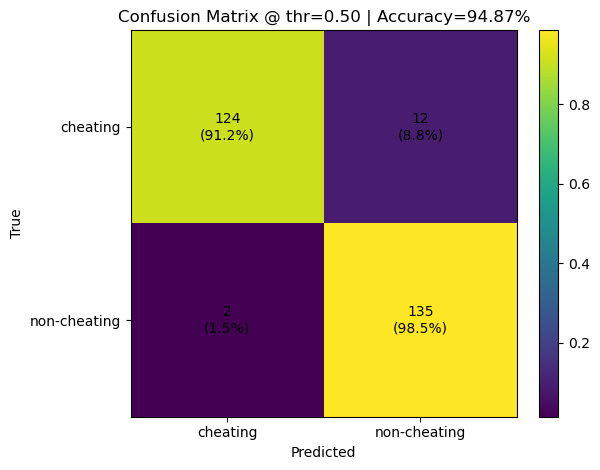

RIGHT: 259 | WRONG: 14 | ACCURACY: 0.9487  (Total: 273)
Class mapping: {'cheating': 0, 'non-cheating': 1}
    cheating -> precision=0.984  recall=0.912  F1=0.947  support=136
non-cheating -> precision=0.918  recall=0.985  F1=0.951  support=137


In [8]:
# Confusion matrix + detailed accuracy at FIXED threshold = 0.50
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score, precision_recall_fscore_support

# --- 1) Use fixed threshold ---
thr = 0.50

# --- 2) Predict on TEST (assumes you already have: model, test_gen) ---
probs = model.predict(test_gen, verbose=0).ravel()
pred  = (probs >= thr).astype(int)
true  = test_gen.classes

# --- 3) Metrics ---
labels = [name for name, idx in sorted(test_gen.class_indices.items(), key=lambda kv: kv[1])]
cm   = confusion_matrix(true, pred, labels=[0,1])
acc  = accuracy_score(true, pred)
prec, rec, f1, supp = precision_recall_fscore_support(true, pred, labels=[0,1], zero_division=0)
right = int((pred == true).sum())
wrong = int((pred != true).sum())

# --- 4) Plot confusion matrix (counts + normalized %) ---
cm_norm = cm / cm.sum(axis=1, keepdims=True)
fig, ax = plt.subplots()
im = ax.imshow(cm_norm, interpolation="nearest")
ax.figure.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
ax.set(
    xticks=[0,1], xticklabels=labels,
    yticks=[0,1], yticklabels=labels,
    xlabel="Predicted", ylabel="True",
    title=f"Confusion Matrix @ thr=0.50 | Accuracy={acc*100:.2f}%"
)
for i in range(2):
    for j in range(2):
        ax.text(j, i, f"{cm[i,j]}\n({cm_norm[i,j]*100:.1f}%)", ha="center", va="center")
plt.tight_layout()
plt.show()

# --- 5) Friendly summary for the report ---
print(f"RIGHT: {right} | WRONG: {wrong} | ACCURACY: {acc:.4f}  (Total: {len(true)})")
print("Class mapping:", test_gen.class_indices)
for i, name in enumerate(labels):
    print(f"{name:>12s} -> precision={prec[i]:.3f}  recall={rec[i]:.3f}  F1={f1[i]:.3f}  support={supp[i]}")


Found 97 images belonging to 2 classes.


C:\Users\arnel\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Prediction-set accuracy @ thr=0.110: 90.72%  | RIGHT=88  WRONG=9
Class mapping: {'cheating': 0, 'non-cheating': 1}

Classification report:
               precision    recall  f1-score   support

    cheating     1.0000    0.8200    0.9011        50
non-cheating     0.8393    1.0000    0.9126        47

    accuracy                         0.9072        97
   macro avg     0.9196    0.9100    0.9069        97
weighted avg     0.9221    0.9072    0.9067        97



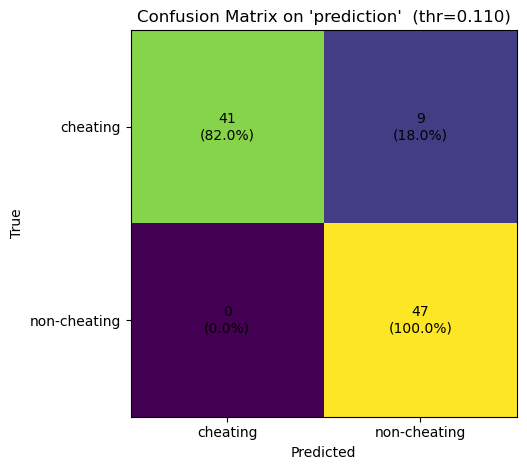


Showing up to 20 misclassified images (9 total wrong):


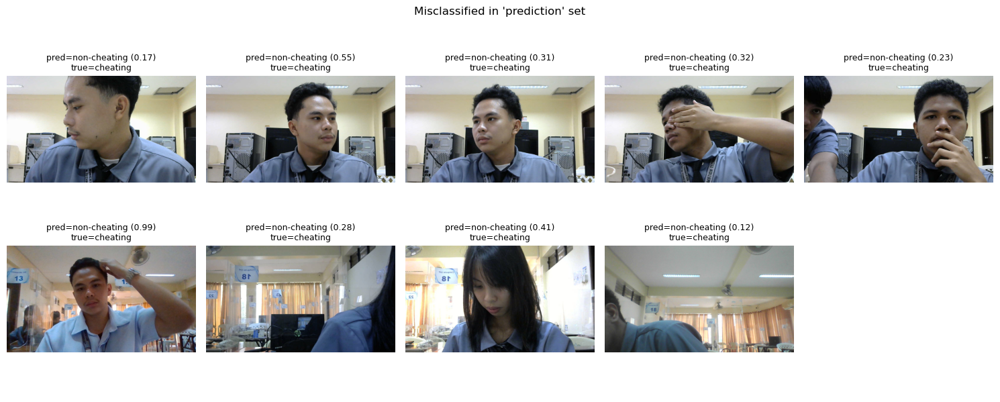

In [11]:
# Evaluate 'dataset_split/prediction' (has cheating/non-cheating subfolders) using 94% model
import numpy as np, math
import matplotlib.pyplot as plt
from pathlib import Path
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from PIL import Image

# 1) Load model + threshold used for 94.9% test accuracy
best_path = "mnv2_continue.keras" if Path("mnv2_continue.keras").exists() else "mnv2_finetune_best.keras"
model = keras.models.load_model(best_path, compile=False)
H, W = model.input_shape[1:3]
thr = 0.515
bp = Path("best_threshold.npy")
if bp.exists():
    try: thr = float(np.load(bp)[0])
    except: pass

# 2) Directories (works if notebook is in MobileNetV2/ or MobileNetV2/dataset_split/)
ROOT = Path.cwd()
DATA = ROOT if (ROOT/"train").is_dir() else (ROOT/"dataset_split")
train_dir = DATA/"train"
pred_dir  = DATA/"prediction"
assert pred_dir.exists(), f"Folder not found: {pred_dir}"

# 3) Fix class order from TRAIN (keeps label mapping identical)
classes = sorted([p.name for p in train_dir.iterdir() if p.is_dir()])

# 4) Build generator for prediction set (has labels)
gen = ImageDataGenerator(preprocessing_function=preprocess_input).flow_from_directory(
    str(pred_dir), target_size=(H, W), batch_size=32,
    class_mode="binary", shuffle=False, classes=classes # <- lock class order
)

# 5) Predict and compute metrics
probs = model.predict(gen, verbose=0).ravel()
pred  = (probs >= thr).astype(int)
true  = gen.classes

acc = accuracy_score(true, pred)
cm  = confusion_matrix(true, pred, labels=[0,1])
print(f"Prediction-set accuracy @ thr={thr:.3f}: {acc*100:.2f}%  | RIGHT={int((pred==true).sum())}  WRONG={int((pred!=true).sum())}")
print("Class mapping:", gen.class_indices)
print("\nClassification report:\n", classification_report(true, pred, digits=4, target_names=classes))

# 6) Confusion matrix plot (counts + row-normalized %)
cm_norm = cm / cm.sum(axis=1, keepdims=True)
plt.figure()
plt.imshow(cm_norm, interpolation="nearest")
plt.title(f"Confusion Matrix on 'prediction'  (thr={thr:.3f})")
plt.xticks([0,1], classes); plt.yticks([0,1], classes)
for i in range(2):
    for j in range(2):
        plt.text(j, i, f"{cm[i,j]}\n({cm_norm[i,j]*100:.1f}%)", ha="center", va="center")
plt.xlabel("Predicted"); plt.ylabel("True"); plt.tight_layout()
plt.show()

# 7) Show a grid of WRONG predictions (helps you inspect what the model gets wrong)
#    Grab filenames from the generator
files = [Path(pred_dir) / f for f in gen.filenames]
wrong_idx = np.where(pred != true)[0]
print(f"\nShowing up to 20 misclassified images ({len(wrong_idx)} total wrong):")

def show_grid(indices, title, nmax=20, ncols=5):
    idx = indices[:nmax]
    if len(idx) == 0:
        print("No items to display.")
        return
    nrows = math.ceil(len(idx)/ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*3.0, nrows*3.0))
    axes = np.array(axes).reshape(-1)
    for k, i in enumerate(idx):
        ax = axes[k]
        img = Image.open(files[i]).convert("RGB")
        ax.imshow(img); ax.axis("off")
        ax.set_title(f"pred={classes[pred[i]]} ({probs[i]:.2f})\ntrue={classes[true[i]]}", fontsize=9)
    for k in range(len(idx), len(axes)): axes[k].axis("off")
    fig.suptitle(title, y=0.99); plt.tight_layout(); plt.show()

show_grid(wrong_idx, "Misclassified in 'prediction' set")

In [12]:
from pathlib import Path
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

ROOT = Path.cwd()
DATA = ROOT if (ROOT/"train").is_dir() else (ROOT/"dataset_split")
VAL_NAME = "val" if (DATA/"val").is_dir() else "valid"

img_size = (224, 224)  # will be overridden by model.input_shape later
batch = 32

# Lock class order from TRAIN
classes = sorted([p.name for p in (DATA/"train").iterdir() if p.is_dir()])
print("Classes:", classes)

datagen_train = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    horizontal_flip=True, rotation_range=10, width_shift_range=0.05, height_shift_range=0.05
)
datagen_eval = ImageDataGenerator(preprocessing_function=preprocess_input)

train_gen = datagen_train.flow_from_directory(str(DATA/"train"), target_size=img_size,
                                              batch_size=batch, class_mode="binary",
                                              shuffle=True, classes=classes)
val_gen   = datagen_eval.flow_from_directory(str(DATA/VAL_NAME), target_size=img_size,
                                             batch_size=batch, class_mode="binary",
                                             shuffle=False, classes=classes)
test_gen  = datagen_eval.flow_from_directory(str(DATA/"test"), target_size=img_size,
                                             batch_size=batch, class_mode="binary",
                                             shuffle=False, classes=classes)

# Optional: class weights (useful if class counts changed)
import numpy as np
from collections import Counter
cnt = Counter(train_gen.classes)
total = sum(cnt.values())
class_weight = {0: total/(2*cnt[0]), 1: total/(2*cnt[1])}
print("Train counts:", cnt, " | class_weight:", class_weight)

Classes: ['cheating', 'non-cheating']
Found 1800 images belonging to 2 classes.
Found 380 images belonging to 2 classes.
Found 254 images belonging to 2 classes.
Train counts: Counter({0: 900, 1: 900})  | class_weight: {0: 1.0, 1: 1.0}


In [13]:
import numpy as np
from pathlib import Path
from tensorflow import keras
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score

# Load your best checkpoint
best_path = "mnv2_continue.keras" if Path("mnv2_continue.keras").exists() else "mnv2_finetune_best.keras"
model = keras.models.load_model(best_path, compile=False)

# Ensure generator target_size matches model input
H, W = model.input_shape[1:3]
train_gen.target_size = (H, W)
val_gen.target_size   = (H, W)
test_gen.target_size  = (H, W)

# --- A) Head repair (freeze backbone, re-train top 3–5 epochs) ---
# Try to find the backbone block (MobileNetV2)
def find_backbone(l):
    if "mobilenet" in l.name.lower():
        return l
    for s in getattr(l, "layers", []):
        x = find_backbone(s)
        if x is not None: return x
    return None

backbone = find_backbone(model)
for L in (backbone.layers if backbone else []):
    L.trainable = False  # freeze feature extractor

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=3e-4),
    loss=keras.losses.BinaryCrossentropy(label_smoothing=0.01),
    metrics=[keras.metrics.BinaryAccuracy(name="acc"),
             keras.metrics.AUC(name="auc"),
             keras.metrics.Precision(name="prec"),
             keras.metrics.Recall(name="rec")]
)

model.fit(train_gen, validation_data=val_gen, epochs=3, class_weight=class_weight, verbose=1)

# --- B) Fine-tune last N layers with tiny LR ---
if backbone:
    N = 80  # unfreeze tail (tune 60–120 depending on compute)
    for L in backbone.layers[:-N]: L.trainable = False
    for L in backbone.layers[-N:]: L.trainable = True

model.compile(
    optimizer=keras.optimizers.AdamW(learning_rate=5e-6, weight_decay=5e-5),
    loss=keras.losses.BinaryCrossentropy(label_smoothing=0.01),
    metrics=[keras.metrics.BinaryAccuracy(name="acc"),
             keras.metrics.AUC(name="auc"),
             keras.metrics.Precision(name="prec"),
             keras.metrics.Recall(name="rec")]
)

cbs = [
    keras.callbacks.ModelCheckpoint("mnv2_clean_best.keras", monitor="val_auc", mode="max", save_best_only=True),
    keras.callbacks.ReduceLROnPlateau(monitor="val_auc", mode="max", patience=3, factor=0.5),
    keras.callbacks.EarlyStopping(monitor="val_auc", mode="max", patience=6, restore_best_weights=True),
]

history = model.fit(train_gen, validation_data=val_gen, epochs=12,
                    class_weight=class_weight, callbacks=cbs, verbose=1)

# --- C) Re-pick threshold on (corrected) validation set for your report ---
val_prob = model.predict(val_gen, verbose=0).ravel()
val_true = val_gen.classes
grid = np.linspace(0.05, 0.95, 181)
t_best = max(grid, key=lambda t: accuracy_score(val_true, (val_prob>=t).astype(int)))
print(f"Best thr on corrected VAL for ACC: {t_best:.3f} | VAL Acc: {accuracy_score(val_true, (val_prob>=t_best).astype(int)):.4f}")
np.save("best_threshold.npy", np.array([t_best]))

# --- D) Final test evaluation (single pass; do not tune on test) ---
test_prob = model.predict(test_gen, verbose=0).ravel()
test_true = test_gen.classes
test_pred = (test_prob >= t_best).astype(int)

from sklearn.metrics import confusion_matrix, classification_report
right = int((test_pred==test_true).sum())
acc   = accuracy_score(test_true, test_pred)
auc   = roc_auc_score(test_true, test_prob)
print(f"TEST: RIGHT={right} WRONG={len(test_true)-right} ACC={acc:.4f} AUC={auc:.4f}")
print("Confusion matrix:\n", confusion_matrix(test_true, test_pred))
print("\nReport:\n", classification_report(test_true, test_pred, digits=4,
      target_names=[c for c,_ in sorted(test_gen.class_indices.items(), key=lambda kv: kv[1])]))

C:\Users\arnel\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/3
57/57 ━━━━━━━━━━━━━━━━━━━━ 191s 3s/step - acc: 0.9812 - auc: 0.9951 - loss: 0.1068 - prec: 0.9688 - rec: 0.9942 - val_acc: 0.9447 - val_auc: 0.9738 - val_loss: 0.1973 - val_prec: 0.9246 - val_rec: 0.9684
Epoch 2/3
57/57 ━━━━━━━━━━━━━━━━━━━━ 150s 3s/step - acc: 0.9832 - auc: 0.9941 - loss: 0.1048 - prec: 0.9713 - rec: 0.9955 - val_acc: 0.9474 - val_auc: 0.9737 - val_loss: 0.1976 - val_prec: 0.9250 - val_rec: 0.9737
Epoch 3/3
57/57 ━━━━━━━━━━━━━━━━━━━━ 144s 3s/step - acc: 0.9812 - auc: 0.9944 - loss: 0.1004 - prec: 0.9731 - rec: 0.9897 - val_acc: 0.9474 - val_auc: 0.9740 - val_loss: 0.1975 - val_prec: 0.9250 - val_rec: 0.9737
Epoch 1/12
57/57 ━━━━━━━━━━━━━━━━━━━━ 237s 3s/step - acc: 0.9734 - auc: 0.9927 - loss: 0.1251 - prec: 0.9674 - rec: 0.9795 - val_acc: 0.9447 - val_auc: 0.9734 - val_loss: 0.1997 - val_prec: 0.9204 - val_rec: 0.9737 - learning_rate: 5.0000e-06
Epoch 2/12
57/57 ━━━━━━━━━━━━━━━━━━━━ 164s 3s/step - acc: 0.9747 - auc: 0.9917 - loss: 0.1191 - prec: 0.9597 - rec:

C:\Users\arnel\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


TEST: RIGHT=246 WRONG=8 ACC=0.9685 AUC=0.9940
Confusion matrix:
 [[124   3]
 [  5 122]]

Report:
               precision    recall  f1-score   support

    cheating     0.9612    0.9764    0.9688       127
non-cheating     0.9760    0.9606    0.9683       127

    accuracy                         0.9685       254
   macro avg     0.9686    0.9685    0.9685       254
weighted avg     0.9686    0.9685    0.9685       254



Found 254 images belonging to 2 classes.


C:\Users\arnel\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


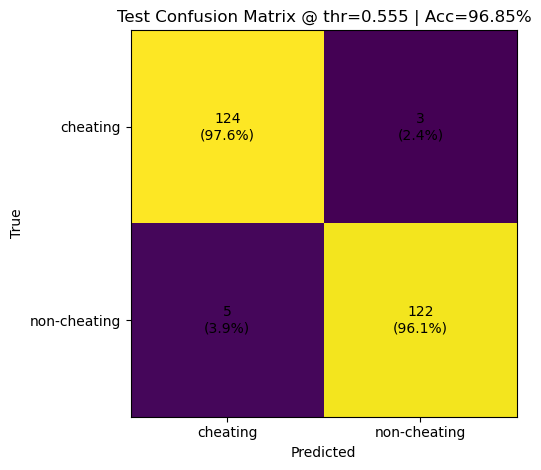

RIGHT: 246 | WRONG: 8 | ACCURACY: 0.9685
Class mapping: {'cheating': 0, 'non-cheating': 1}


In [14]:
# --- Plot TEST confusion matrix (counts + %) with your saved model ---
import numpy as np, matplotlib.pyplot as plt
from pathlib import Path
from sklearn.metrics import confusion_matrix, accuracy_score
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# 1) Load model + threshold
candidates = ["mnv2_clean_best.keras", "mnv2_continue.keras", "mnv2_finetune_best.keras", "mnv2_finetuned.keras"]
best_path = next((p for p in candidates if Path(p).exists()), None)
assert best_path, "No saved model file found."
model = keras.models.load_model(best_path, compile=False)

thr = 0.555
if Path("best_threshold.npy").exists():
    try: thr = float(np.load("best_threshold.npy")[0])
    except: pass

# 2) Resolve data dirs and class order from TRAIN
ROOT = Path.cwd()
DATA = ROOT if (ROOT/"train").is_dir() else (ROOT/"dataset_split")
train_dir = DATA/"train"
test_dir  = DATA/"test"
classes = sorted([p.name for p in train_dir.iterdir() if p.is_dir()])

# 3) Build test generator (same preprocessing as training)
H, W = model.input_shape[1:3]
datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_gen = datagen.flow_from_directory(
    str(test_dir), target_size=(H, W), batch_size=32,
    class_mode="binary", shuffle=False, classes=classes
)

# 4) Predict, compute CM and accuracy
probs = model.predict(test_gen, verbose=0).ravel()
pred  = (probs >= thr).astype(int)
true  = test_gen.classes

cm   = confusion_matrix(true, pred, labels=[0,1])
acc  = accuracy_score(true, pred)
cmn  = cm / cm.sum(axis=1, keepdims=True)

# 5) Plot
labels = [name for name, idx in sorted(test_gen.class_indices.items(), key=lambda kv: kv[1])]

plt.figure()
plt.imshow(cmn, interpolation="nearest")
plt.title(f"Test Confusion Matrix @ thr={thr:.3f} | Acc={acc*100:.2f}%")
plt.xticks([0,1], labels); plt.yticks([0,1], labels)
for i in range(2):
    for j in range(2):
        plt.text(j, i, f"{cm[i,j]}\n({cmn[i,j]*100:.1f}%)", ha="center", va="center")
plt.xlabel("Predicted"); plt.ylabel("True")
plt.tight_layout()
plt.show()

print(f"RIGHT: {(pred==true).sum()} | WRONG: {(pred!=true).sum()} | ACCURACY: {acc:.4f}")
print("Class mapping:", test_gen.class_indices)


Using model: mnv2_clean_best.keras
Using threshold: 0.555
Classes (index mapping): {'cheating': 0, 'non-cheating': 1}
Found 95 images belonging to 2 classes.


C:\Users\arnel\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Prediction-set ACC @ thr=0.555: 98.95%
Confusion matrix (rows=true, cols=pred):
 [[49  1]
 [ 0 45]]
Counts by predicted label: {'cheating': 49, 'non-cheating': 46}


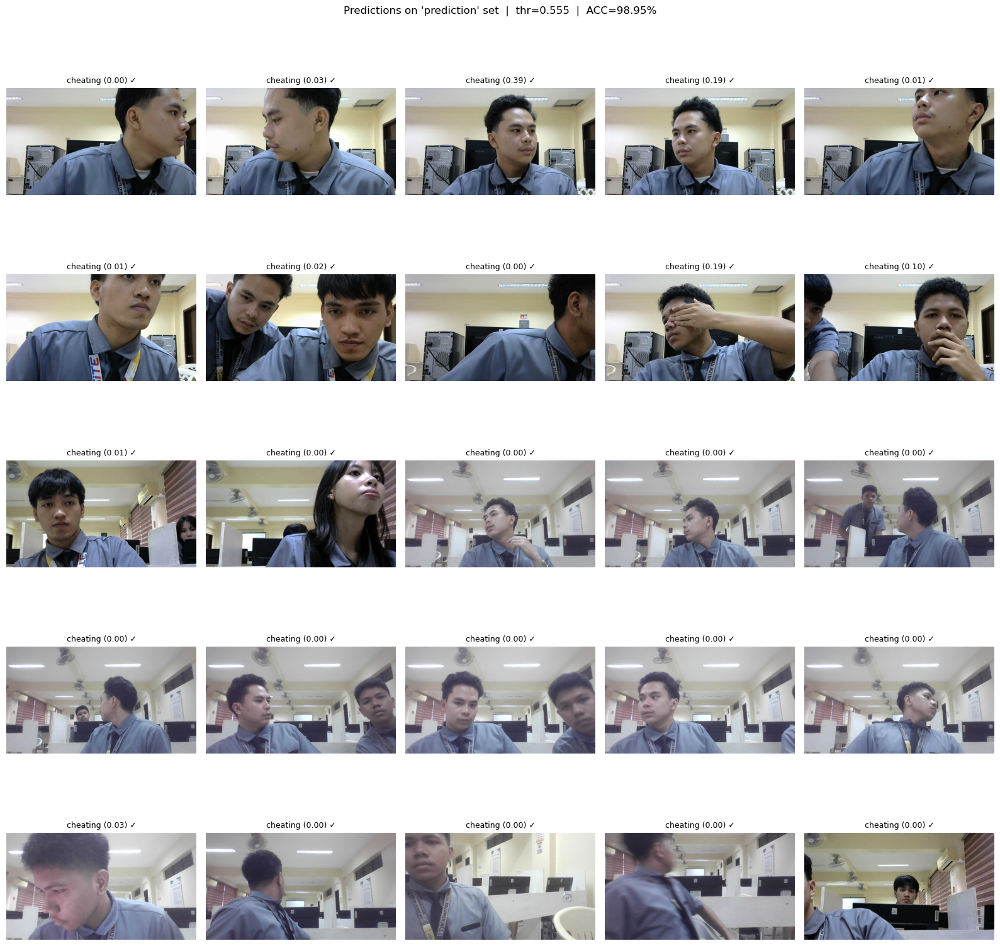

In [15]:
# Predict on dataset_split/prediction and plot images with predicted labels (✓/✗)
import math, numpy as np, matplotlib.pyplot as plt
from pathlib import Path
from collections import Counter
from PIL import Image
from sklearn.metrics import confusion_matrix, accuracy_score
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# --- 1) Load the UPDATED model + threshold ---
candidates = ["mnv2_clean_best.keras", "mnv2_continue.keras", "mnv2_finetune_best.keras", "mnv2_finetuned.keras"]
model_path = next((p for p in candidates if Path(p).exists()), None)
assert model_path, "No model file found. Expected one of: " + ", ".join(candidates)
print("Using model:", model_path)
model = keras.models.load_model(model_path, compile=False)

thr = 0.555
bp = Path("best_threshold.npy")
if bp.exists():
    try: thr = float(np.load(bp)[0])
    except: pass
print(f"Using threshold: {thr:.3f}")

# --- 2) Resolve folders & class order (lock to TRAIN order) ---
ROOT = Path.cwd()
DATA = ROOT if (ROOT/"train").is_dir() else (ROOT/"dataset_split")
train_dir = DATA/"train"
pred_dir  = DATA/"prediction"
assert pred_dir.exists(), f"Folder not found: {pred_dir}"

classes = sorted([p.name for p in train_dir.iterdir() if p.is_dir()])
print("Classes (index mapping):", {c:i for i,c in enumerate(classes)})

# --- 3) Generator for prediction set (has labels from subfolders) ---
H, W = model.input_shape[1:3]
gen = ImageDataGenerator(preprocessing_function=preprocess_input).flow_from_directory(
    str(pred_dir),
    target_size=(H, W),
    batch_size=32,
    class_mode="binary",
    shuffle=False,
    classes=classes,   # lock class order
)

# --- 4) Predict ---
probs = model.predict(gen, verbose=0).ravel()
pred_idx = (probs >= thr).astype(int)
true_idx = gen.classes
pred_names = [classes[i] for i in pred_idx]
true_names = [classes[i] for i in true_idx]

# --- 5) Metrics on the 'prediction' set (since it has labels) ---
acc = accuracy_score(true_idx, pred_idx)
cm = confusion_matrix(true_idx, pred_idx, labels=[0,1])
print(f"\nPrediction-set ACC @ thr={thr:.3f}: {acc*100:.2f}%")
print("Confusion matrix (rows=true, cols=pred):\n", cm)
print("Counts by predicted label:", dict(Counter(pred_names)))

# --- 6) Plot a grid of images with predicted labels (✓ correct / ✗ wrong) ---
# Use original image files so you see them un-resized in the plot
file_paths = [Path(pred_dir)/f for f in gen.filenames]

N = min(25, len(file_paths))   # how many to show
ncols = 5
nrows = math.ceil(N / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*3.2, nrows*3.2))
axes = np.array(axes).reshape(-1)

for i in range(N):
    ax = axes[i]
    img = Image.open(file_paths[i]).convert("RGB")
    ax.imshow(img); ax.axis("off")

    ok = (pred_idx[i] == true_idx[i])
    mark = "✓" if ok else "✗"
    ax.set_title(f"{pred_names[i]} ({probs[i]:.2f}) {mark}", fontsize=9)

# hide any extra axes
for j in range(N, len(axes)):
    axes[j].axis("off")

plt.suptitle(f"Predictions on 'prediction' set  |  thr={thr:.3f}  |  ACC={acc*100:.2f}%", y=0.995)
plt.tight_layout()
plt.show()

Using model: mnv2_clean_best.keras
Using threshold: 0.555
Classes (index mapping): {'cheating': 0, 'non-cheating': 1}
Found 95 images belonging to 2 classes.


C:\Users\arnel\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Prediction-set ACC @ thr=0.555: 98.95%  |  N=95
Confusion matrix (rows=true, cols=pred):
 [[49  1]
 [ 0 45]]
Counts by predicted label: {'cheating': 49, 'non-cheating': 46}
Counts by TRUE label   : {'cheating': 50, 'non-cheating': 45}

Rendering 95 images across 4 page(s)...


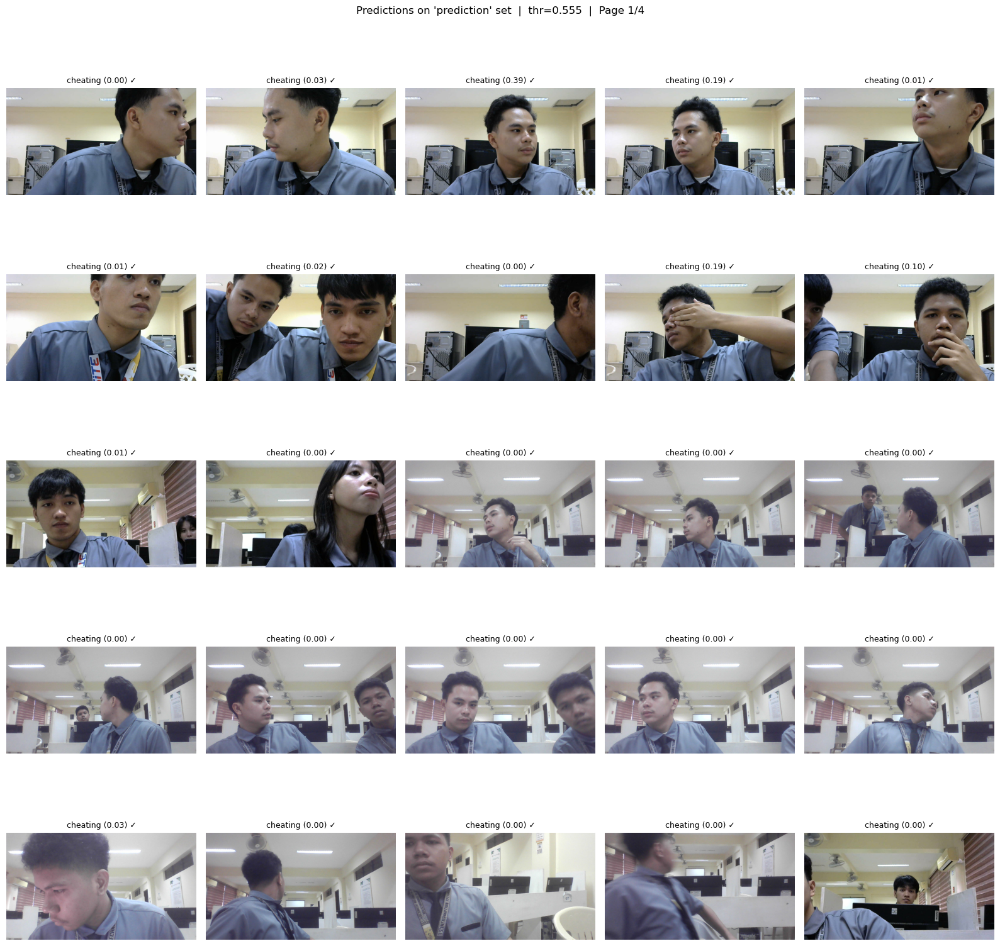

Saved: prediction_page_01.png


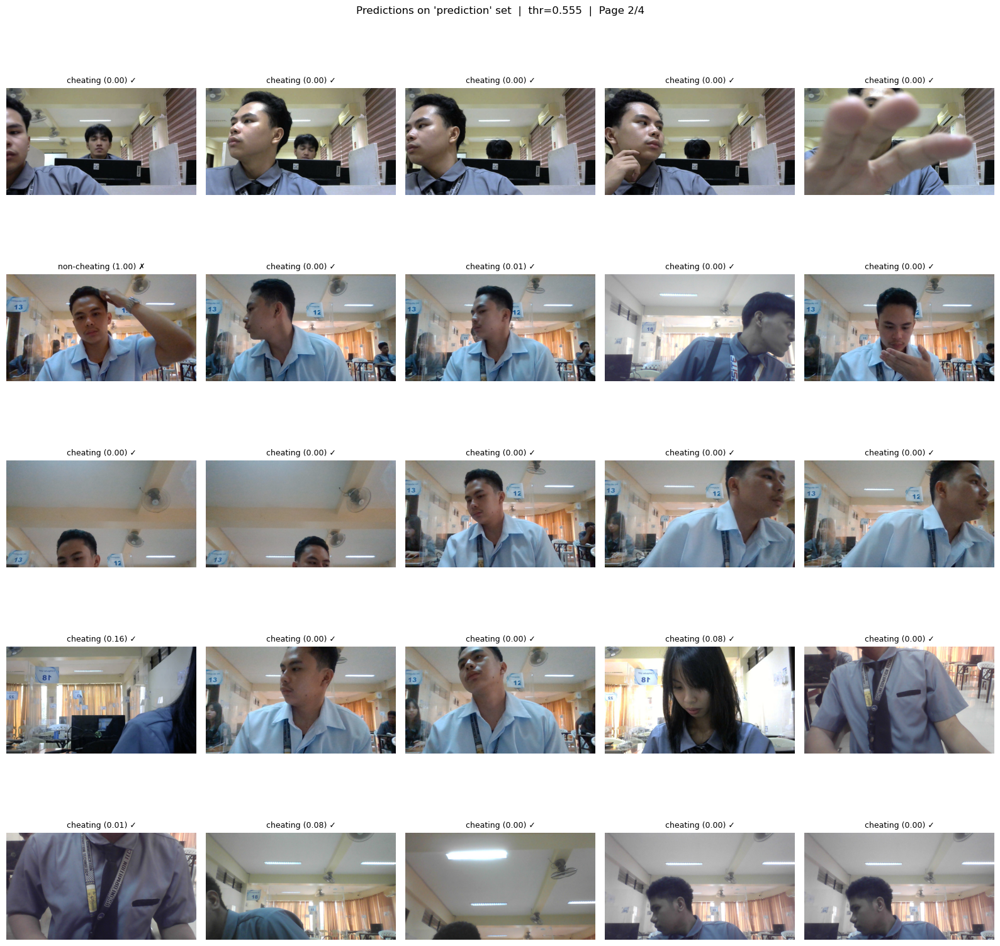

Saved: prediction_page_02.png


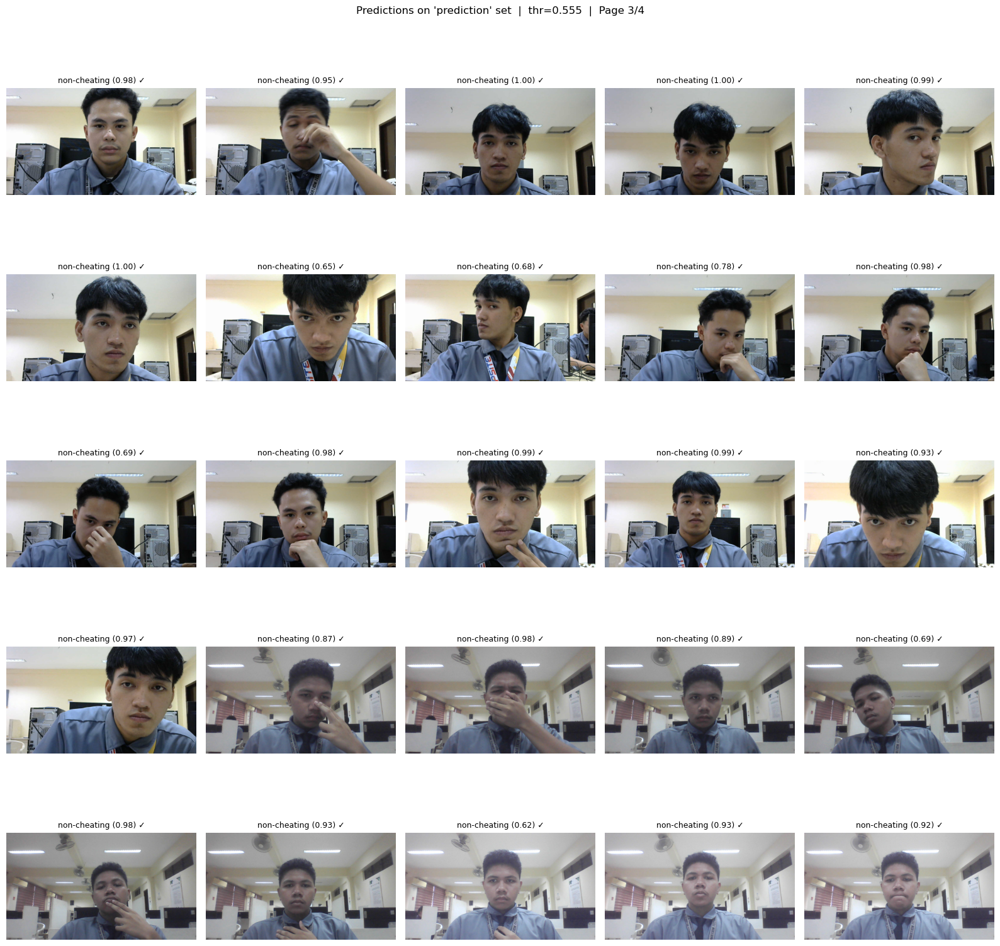

Saved: prediction_page_03.png


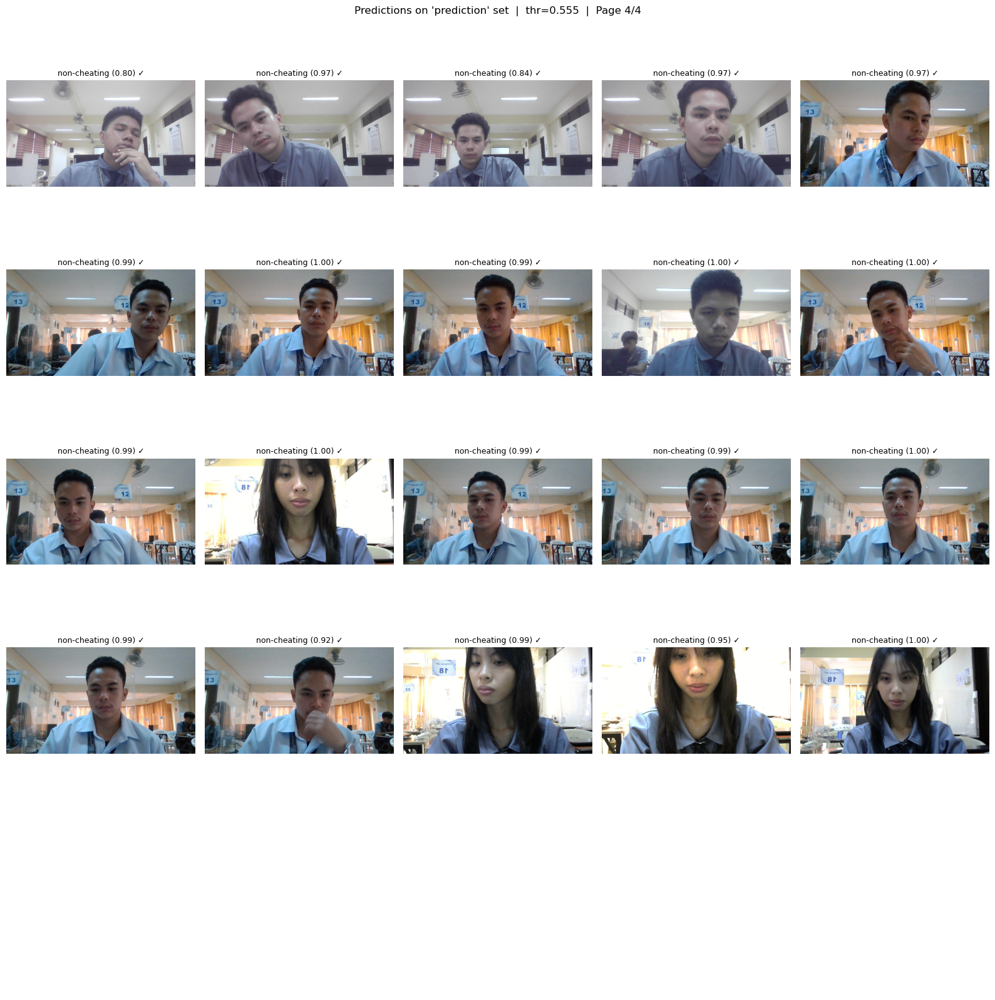

Saved: prediction_page_04.png

Done.


In [16]:
# Plot ALL images in dataset_split/prediction with model predictions (paged grids)
import math, numpy as np, matplotlib.pyplot as plt
from pathlib import Path
from collections import Counter
from PIL import Image
from sklearn.metrics import accuracy_score, confusion_matrix
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# --- 1) Load updated model + threshold ---
candidates = ["mnv2_clean_best.keras", "mnv2_continue.keras", "mnv2_finetune_best.keras", "mnv2_finetuned.keras"]
model_path = next((p for p in candidates if Path(p).exists()), None)
assert model_path, "No model file found."
print("Using model:", model_path)
model = keras.models.load_model(model_path, compile=False)

thr = 0.555
if Path("best_threshold.npy").exists():
    try: thr = float(np.load("best_threshold.npy")[0])
    except: pass
print(f"Using threshold: {thr:.3f}")

# --- 2) Data dirs + class order (lock to TRAIN order) ---
ROOT = Path.cwd()
DATA = ROOT if (ROOT/"train").is_dir() else (ROOT/"dataset_split")
train_dir = DATA/"train"
pred_dir  = DATA/"prediction"
assert pred_dir.exists(), f"Folder not found: {pred_dir}"

classes = sorted([p.name for p in train_dir.iterdir() if p.is_dir()])
print("Classes (index mapping):", {c:i for i,c in enumerate(classes)})

# --- 3) Build generator for prediction set (has labels from subfolders) ---
H, W = model.input_shape[1:3]
gen = ImageDataGenerator(preprocessing_function=preprocess_input).flow_from_directory(
    str(pred_dir), target_size=(H, W), batch_size=32,
    class_mode="binary", shuffle=False, classes=classes
)

# --- 4) Predict ---
probs = model.predict(gen, verbose=0).ravel()
pred_idx = (probs >= thr).astype(int)
true_idx = gen.classes
pred_names = [classes[i] for i in pred_idx]
true_names = [classes[i] for i in true_idx]

# --- 5) Metrics on the prediction set ---
acc = accuracy_score(true_idx, pred_idx)
cm = confusion_matrix(true_idx, pred_idx, labels=[0,1])
print(f"\nPrediction-set ACC @ thr={thr:.3f}: {acc*100:.2f}%  |  N={len(true_idx)}")
print("Confusion matrix (rows=true, cols=pred):\n", cm)
print("Counts by predicted label:", dict(Counter(pred_names)))
print("Counts by TRUE label   :", dict(Counter(true_names)))

# --- 6) Plot ALL images in pages (25 per page) and save each page as PNG ---
file_paths = [Path(pred_dir)/f for f in gen.filenames]
N = len(file_paths)
per_page = 25
n_pages = math.ceil(N / per_page)
ncols = 5
nrows = math.ceil(per_page / ncols)

print(f"\nRendering {N} images across {n_pages} page(s)...")

def load_rgb(path: Path):
    # robust loader
    im = Image.open(path).convert("RGB")
    return im

for p in range(n_pages):
    start = p * per_page
    end   = min(N, (p+1) * per_page)
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*3.2, nrows*3.2))
    axes = np.array(axes).reshape(-1)

    for k, i in enumerate(range(start, end)):
        ax = axes[k]
        img = load_rgb(file_paths[i])
        ax.imshow(img); ax.axis("off")
        ok = (pred_idx[i] == true_idx[i])
        mark = "✓" if ok else "✗"
        ax.set_title(f"{pred_names[i]} ({probs[i]:.2f}) {mark}", fontsize=9)

    # hide leftover axes on last page
    for k in range(end-start, len(axes)):
        axes[k].axis("off")

    fig.suptitle(f"Predictions on 'prediction' set  |  thr={thr:.3f}  |  Page {p+1}/{n_pages}", y=0.995)
    plt.tight_layout()
    out_path = Path(f"prediction_page_{p+1:02d}.png")
    plt.savefig(out_path, dpi=150)
    plt.show()
    print("Saved:", out_path)

print("\nDone.")